In [2]:
import pandas as pd
import os
import sys
import glob
import json
from os.path import expanduser
import matplotlib.pyplot as plt                   # For graphics
import numpy as np
#from agavepy.agave import Agave, AgaveError
#from agavepy.files.download import files_download
%matplotlib inline

from transcriptic import commands, Container
from transcriptic.config import Connection
from transcriptic.jupyter import objects




%load_ext autoreload
%reload_ext autoreload
%autoreload 2

from pysd2cat.data import tx_fcs
from pysd2cat.analysis import live_dead_analysis as lda
from pysd2cat.analysis.Names import Names
from pysd2cat.analysis import biofab_live_dead_analysis as blda
from pysd2cat.data import biofab_live_dead as bld
from pysd2cat.plot import biofab_live_dead_plots as bldp

from pysd2cat.data import pipeline


Connection.from_file("~/.transcriptic")
tx_config = json.load(open(os.path.join(expanduser("~"), ".transcriptic")))
transcriptic_email = tx_config['email']
transcriptic_token = tx_config['token']


out_dir='.' # test harness output

experiments = [
    'experiment.uw_biofab.34601',
    'experiment.uw_biofab.34600',
    'r1dd37mcxv5pf4',
    'r1dk8xp9dymm54',
    'r1dmsrursbqwuz',
    'r1dnj926jr7q9g'
]

run_strain = {
    'experiment.uw_biofab.34600' : 'CEN.PK2 - MAT A',
    'experiment.uw_biofab.34601' : 'S288c_a',
    'r1dd37mcxv5pf4' : 'S288c_a',
    'r1dk8xp9dymm54' : 'S288c_a',
    'r1dmsrursbqwuz' : 'S288c_a',
    'r1dnj926jr7q9g' : 'CEN.PK2 - MAT A'
}

experiment_lab = {
    'experiment.uw_biofab.34600' : 'BioFab',
    'experiment.uw_biofab.34601' : 'BioFab',
    'r1dd37mcxv5pf4' : 'TX',
    'r1dk8xp9dymm54' : 'TX',
    'r1dmsrursbqwuz' : 'TX',
    'r1dnj926jr7q9g' : 'TX'
}

/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotocol-reactor/xplan-dev-env/xplan-dev-env/lib/python3.7/site-packages/FlowCytometryTools/core/docstring.py:56: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  doc = dedent(doc)
/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotocol-reactor/xplan-dev-env/xplan-dev-env/lib/python3.7/site-packages/FlowCytometryTools/core/docstring.py:56: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  doc = dedent(doc)
/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotocol-reactor/xplan-dev-env/test-harness/harness/test_harness_class.py:166: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert (col_name in data_cols,
/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotoco

ModuleNotFoundError: No module named 'agavepy'

In [ ]:
run_id=experiments[5]

flow_data = bld.get_flow_dataframe(run_id)

In [19]:
## Destructive (be careful)
#blda.drop_experiment_from_leader_board('.', 'r1dk8xp9dymm54')

In [4]:
leader_board_df = blda.get_leader_board_df('.', expand_description=True)
len(leader_board_df)

1358

{'dead': {0.0: [1503, 1710, 2029, 3925, 4119, 4907, 2785, 11824, 2304, 1193, 586, 1503], 140.0: [17997, 11115, 6149, 7698, 11066, 7240, 12407, 10660, 18524, 18213, 18999, 18028], 210.0: [44064, 12639, 21671, 29932, 25714, 26360, 25237, 31812, 36848, 41204, 40846, 44097], 280.0: [97060, 38789, 53950, 62476, 58666, 55859, 50892, 60952, 90915, 95678, 98018, 97068], 1120.0: [28685, 114122, 100234, 14675, 27991, 41690, 43810, 39804, 31621, 26329, 29184, 29254]}, 'live': {0.0: [118497, 48813, 63156, 53741, 66197, 86236, 109842, 108176, 117696, 118807, 119414, 118497], 140.0: [72713, 28094, 34945, 32410, 21301, 23015, 23103, 44555, 71413, 70912, 73263, 72682], 210.0: [28599, 15378, 11781, 12369, 11087, 11716, 9951, 18572, 28004, 29021, 30990, 28566], 280.0: [1984, 19711, 3494, 1462, 845, 640, 443, 898, 1440, 1647, 1686, 1976], 1120.0: [16821, 4219, 11455, 23215, 14246, 15411, 15197, 16077, 13155, 13952, 12895, 16252]}}


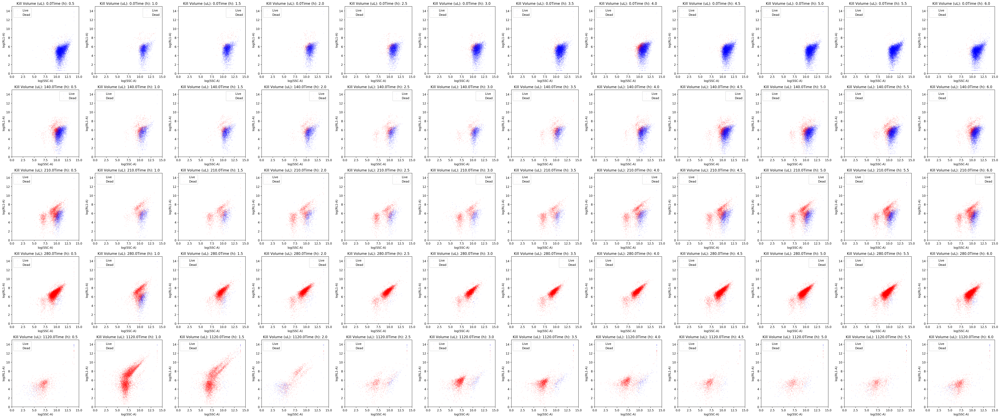

In [9]:
## Plot the time series channels with predictions

prediction_files = glob.glob('data/transcriptic/' + run_id + '/*/data.csv')
def get_time_point(pf):
    return int(pf.split("_")[-1].split('/')[0])
prediction_files = {get_time_point(p) : p for p in prediction_files}
time_points = list(prediction_files.keys())
time_points.sort()

xcol = 'SSC-A'
ycol = 'RL1-A'
stain = "SYTOX Red Stain"

df = pd.read_csv(prediction_files[1], index_col=0)
kill_volumes = list(df.kill_volume.dropna().unique())
kill_volumes.sort()


num_points = bldp.get_timeseries_scatter(xcol, ycol, stain, time_points, kill_volumes, 
                                         prediction_files, flow_data, live_col='live_280', frac=0.1)





print(num_points)


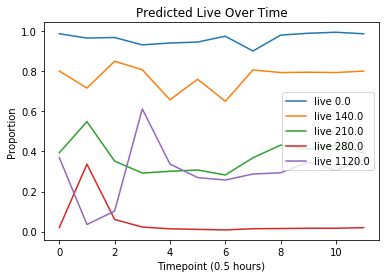

In [10]:
counts = num_points #{'dead': [409100, 406490, 407167, 405627, 405311, 412372, 437616, 454782, 449720, 457355, 457200, 447489], 'live': [70900, 73510, 72833, 74373, 74689, 67628, 42384, 25218, 30280, 22645, 22800, 32511]}

for volume in counts['live'].keys():
    for i in range(len(counts['live'][volume])):
        n = counts['dead'][volume][i] + counts['live'][volume][i]
        counts['dead'][volume][i] /= n
        counts['live'][volume][i] /= n

#plt.plot(counts['dead'], c='r', label='dead')
for volume in counts['live'].keys():
    plt.plot(counts['live'][volume],  label='live '+ str(volume))
plt.title("Predicted Live Over Time")
plt.xlabel("Timepoint (0.5 hours)")
plt.ylabel("Proportion")
plt.legend()

In [14]:
df.live_multi.value_counts()

0    236035
3    197259
1    187923
2    119358
4    85676 
Name: live_multi, dtype: int64

{0: {0.0: [101042, 14469, 19728, 12086, 14051, 22704, 55293, 25005, 69843, 86956, 89292, 101004], 140.0: [8805, 3123, 4158, 6039, 1853, 3331, 2080, 5838, 12962, 15775, 14414, 8818], 210.0: [2368, 1246, 462, 848, 925, 1141, 933, 1550, 3001, 2513, 3218, 2385], 280.0: [422, 1125, 220, 110, 73, 70, 35, 113, 142, 262, 184, 418], 1120.0: [67, 48, 83, 17, 561, 731, 1030, 1174, 292, 209, 128, 64]}, 1: {0.0: [14981, 35187, 44530, 42147, 52350, 63185, 52801, 78732, 46650, 31006, 29820, 15009], 140.0: [64762, 22982, 32657, 26328, 17693, 18859, 19012, 39765, 53904, 49564, 56102, 64676], 210.0: [13331, 12522, 8433, 8732, 7380, 7054, 6734, 13218, 18168, 19789, 20674, 13321], 280.0: [1740, 14403, 2471, 1234, 723, 552, 360, 840, 1112, 1251, 1592, 1735], 1120.0: [29, 384, 260, 11, 163, 276, 306, 442, 27, 86, 53, 30]}, 2: {0.0: [3147, 208, 167, 2527, 3100, 4170, 3755, 14418, 2776, 1370, 338, 3148], 140.0: [11032, 9580, 1837, 5043, 9627, 5652, 10880, 5738, 16790, 17484, 14934, 11083], 210.0: [39885, 7379

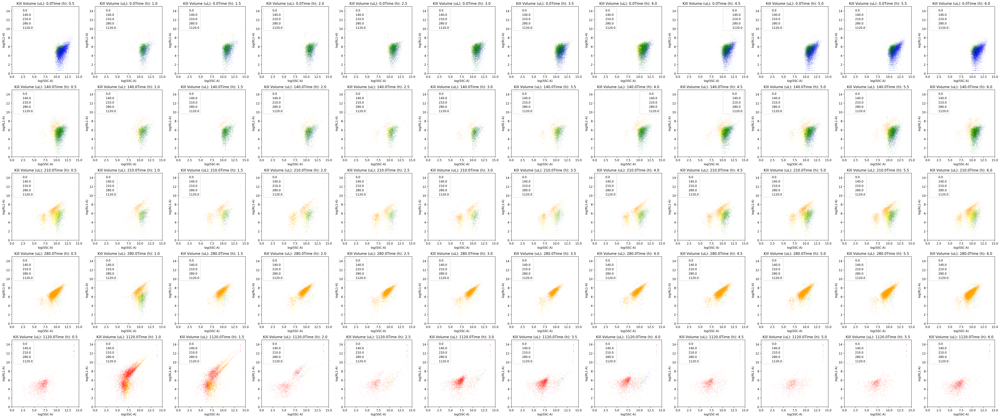

In [17]:
## Plot the time series channels with multi predictions

prediction_files = glob.glob('data/transcriptic/' + run_id + '/*/data.csv')
def get_time_point(pf):
    return int(pf.split("_")[-1].split('/')[0])
prediction_files = {get_time_point(p) : p for p in prediction_files}
time_points = list(prediction_files.keys())
time_points.sort()

xcol = 'SSC-A'
ycol = 'RL1-A'
stain = "SYTOX Red Stain"

df = pd.read_csv(prediction_files[1], index_col=0)
kill_volumes = list(df.kill_volume.dropna().unique())
kill_volumes.sort()


num_points = bldp.get_timeseries_multi_scatter(xcol, ycol, stain, time_points, kill_volumes, 
                                         prediction_files, flow_data, live_col='live_multi', frac=0.1)





print(num_points)


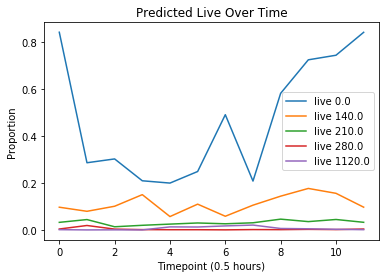

In [19]:
counts = {}
counts['live'] = num_points[0]
counts['dead'] = {}
for i in num_points:
    if i == 0:
        continue
    else:
        for j in num_points[i]:
            if j in counts['dead']:
                counts['dead'][j] = [ x+y for x,y in zip(counts['dead'][j], num_points[i][j])]
            else:
                counts['dead'][j] = num_points[i][j].copy()


for volume in counts['live'].keys():
    for i in range(len(counts['live'][volume])):
        n = counts['dead'][volume][i] + counts['live'][volume][i]
        counts['dead'][volume][i] /= n
        counts['live'][volume][i] /= n

#plt.plot(counts['dead'], c='r', label='dead')
for volume in counts['live'].keys():
    plt.plot(counts['live'][volume],  label='live '+ str(volume))
plt.title("Predicted Live Over Time")
plt.xlabel("Timepoint (0.5 hours)")
plt.ylabel("Proportion")
plt.legend()

In [65]:
flow_data

,Name,DataType,Operation,AnalysisTool,Datasets,time_point,time,container,container_name
4,Flow (Sytox) Plate 12_6.0 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x139998630>,12,6.0,Container(Flow (Sytox) Plate 12),Flow (Sytox) Plate 12
5,Flow (Sytox) Plate 1_0.5 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1399abf28>,1,0.5,Container(Flow (Sytox) Plate 1),Flow (Sytox) Plate 1
6,Flow (Sytox) Plate 4_2.0 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1393d2fd0>,4,2.0,Container(Flow (Sytox) Plate 4),Flow (Sytox) Plate 4
7,Flow (Sytox) Plate 5_2.5 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x13994a898>,5,2.5,Container(Flow (Sytox) Plate 5),Flow (Sytox) Plate 5
8,Flow (Sytox) Plate 7_3.5 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1399984e0>,7,3.5,Container(Flow (Sytox) Plate 7),Flow (Sytox) Plate 7
9,Flow (Sytox) Plate 8_4.0 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1399c54a8>,8,4.0,Container(Flow (Sytox) Plate 8),Flow (Sytox) Plate 8
10,Flow (Sytox) Plate 9_4.5 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1399c5ba8>,9,4.5,Container(Flow (Sytox) Plate 9),Flow (Sytox) Plate 9
11,Flow (Sytox) Plate 11_5.5 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1399de3c8>,11,5.5,Container(Flow (Sytox) Plate 11),Flow (Sytox) Plate 11
12,Flow (Sytox) Plate 2_1.0 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1399deac8>,2,1.0,Container(Flow (Sytox) Plate 2),Flow (Sytox) Plate 2
13,Flow (Sytox) Plate 3_1.5 hour,file,flow_analyze,None,<transcriptic.jupyter.objects.Dataset object at 0x1399ed2e8>,3,1.5,Container(Flow (Sytox) Plate 3),Flow (Sytox) Plate 3


No handles with labels found to put in legend.


1     16
12    14
11    14
10    14
9     14
8     14
7     14
6     14
5     14
4     14
3     14
2     14
Name: time_point, dtype: int64


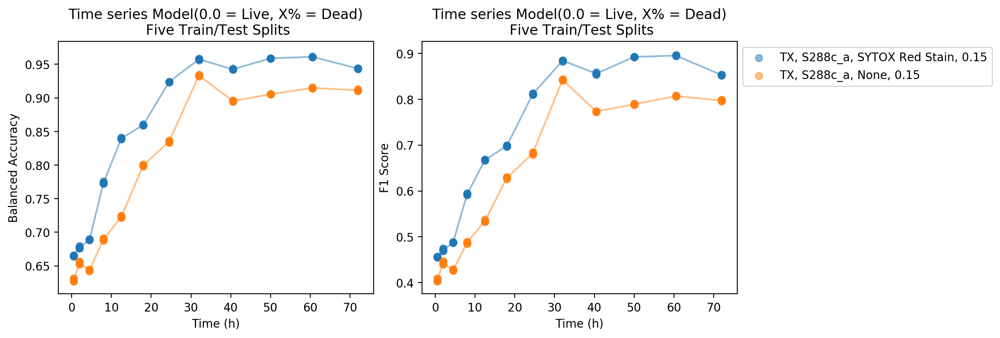

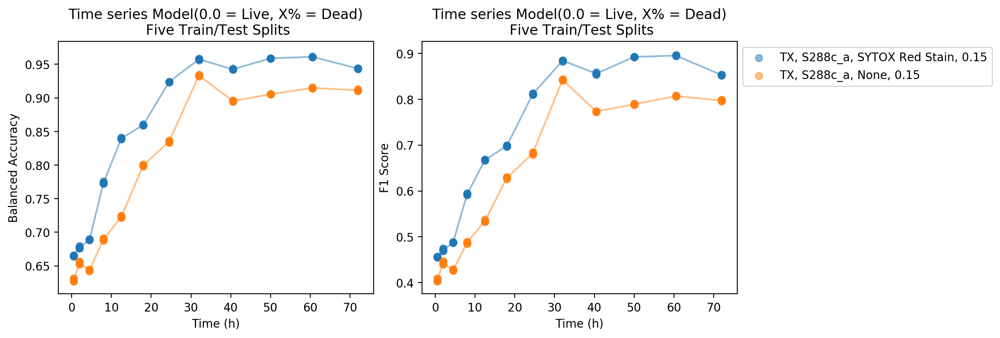

In [25]:
df = leader_board_df.loc[leader_board_df['Data and Split Description'].str.contains(run_id)]
df = df.dropna(subset=['time_point'])
df = df.astype({'time_point': 'int32'})
print(df.time_point.value_counts())
bldp.get_statistics_by_time(df.merge(flow_data, on='time_point'), experiment_strain=run_strain, experiment_lab=experiment_lab)


In [26]:
data_dir = os.path.join('data/transcriptic')
data_files = glob.glob(data_dir + '/' + run_id + '/*/data.csv')
#print(data_files)
channels=['FSC-A', 'SSC-A', 'BL1-A', 'RL1-A', 'FSC-H', 
                                      'SSC-H', 'BL1-H', 'RL1-H', 'FSC-W', 'SSC-W',
                                      'BL1-W', 'RL1-W']

mean_channel_df = pd.DataFrame()
for data_file in data_files:
    data_file_df = pd.read_csv(data_file, index_col=0)
    #print(data_file_df.head(1))
    data_file_df = data_file_df.fillna( 'None')
    for channel in channels:
        data_file_df.loc[:,channel] = data_file_df[channel].apply(np.log)
    data_file_df = data_file_df.replace([-np.inf, np.inf], np.nan)#.dropna(how="any")

    data_file_df = data_file_df.groupby(['kill_volume', 'stain']).agg([np.mean, np.std]).reset_index()
    time_point = int(data_file.split("_")[-1].split('/')[0])
    data_file_df['time_point'] = time_point
    mean_channel_df = mean_channel_df.append(data_file_df, ignore_index=True)
mean_channel_df
    


kill_volume            stain Unnamed: 0.1                Unnamed: 0.1.1                        Time                   FSC-A                SSC-A               BL1-A               RL1-A                FSC-H                SSC-H               BL1-H               RL1-H               FSC-W               SSC-W               BL1-W               RL1-W                index                     live           time_point
                                        mean            std           mean            std         mean          std       mean       std       mean       std      mean       std      mean       std       mean       std       mean       std      mean       std      mean       std      mean       std      mean       std      mean       std      mean       std       mean            std      mean       std           
0   0.0         None             884999.5     183916.507898  603186.5000    217931.516272  1304.198067  725.083484   11.567571  0.961823  12.398832  0.922260  4.255211  1.226579  4.577247  1.231697  10.943095  0.367268  11.896411  0.574757  4.234239  0.395001  4.588790  0.457096  4.189209  0.843426  4.506628  0.895126 NaN       NaN       NaN       NaN        884999.5   183916.507898  0.904050  0.294524  7        
1   0.0         SYTOX Red Stain  247499.5     174338.760129  473014.7500    437426.884477  1316.277300  692.824198   11.632900  1.008317  12.449948  0.939335  4.309184  1.268304  4.889826  1.293302  10.965019  0.367690  11.941080  0.591724  4.239322  0.405937  4.835316  0.502062  4.255168  0.904392  4.564064  0.940770 NaN       NaN        2.406092  1.849056  247499.5   174338.760129  0.970667  0.168740  7        
2   300.0       None             903749.5     170216.032915  627561.5000    208153.368076  3449.972342  2190.687501  11.268572  0.817250  11.764779  1.026367  4.138899  1.132897  4.619517  1.144656  10.909321  0.458684  11.443760  0.793985  4.308312  0.420672  4.789072  0.489898  3.878585  0.637832  4.068906  0.721494 NaN       NaN        5.694099  1.158703  903749.5   170216.032915  0.123923  0.329494  7        
3   300.0       SYTOX Red Stain  313124.5     170412.132419  749307.6875    454155.741677  4462.370825  1597.813016  11.084829  0.788336  11.343333  1.025152  4.132818  1.118128  6.241023  1.291625  10.780726  0.491281  11.064720  0.822592  4.349469  0.427731  6.132184  0.936366  3.773683  0.585368  3.864608  0.672518  3.526361 NaN        3.267560  1.558990  313124.5   170412.132419  0.088194  0.283577  7        
4   0.0         None             899999.5     162481.445100  697362.2500    198418.914454  1576.869967  811.845423   11.484565  0.922694  12.336103  0.898490  4.192370  1.215530  4.506128  1.222411  10.929146  0.356799  11.884467  0.560534  4.221579  0.404802  4.572628  0.467041  4.106962  0.805578  4.431155  0.859746 NaN       NaN        3.044522 NaN        899999.5   162481.445100  0.955933  0.205244  11       
5   0.0         SYTOX Red Stain  337499.5     180676.567472  802362.2500    453680.680928  1452.135325  655.410461   11.518484  0.921869  12.384970  0.896885  4.190878  1.206114  4.719698  1.245822  10.939621  0.346002  11.917989  0.558842  4.212072  0.397626  4.747090  0.501559  4.130604  0.804228  4.464455  0.863068 NaN       NaN        3.424304  0.697122  337499.5   180676.567472  0.983708  0.126595  11       
6   300.0       None             899999.5     175784.141421  687987.2500    222251.406349  4893.235715  2034.167177  10.887967  0.618981  11.083721  0.884829  4.001263  1.055156  4.475066  1.065085  10.711523  0.456229  10.909342  0.775261  4.297018  0.410662  4.790005  0.475623  3.604102  0.390356  3.667713  0.497391 NaN       NaN        5.086835  1.852703  899999.5   175784.141421  0.081396  0.273442  11       
7   300.0       SYTOX Red Stain  290624.5     169999.028181  551180.8750    463040.990186  5136.962523  1609.541887  10.882625  0.657889  11.057968  0.906557  4.014132  1.069373  6.510886  1.142647  10.686915  0.474076  10.869228  0.782731  4.303252 

['None' 'SYTOX Red Stain']


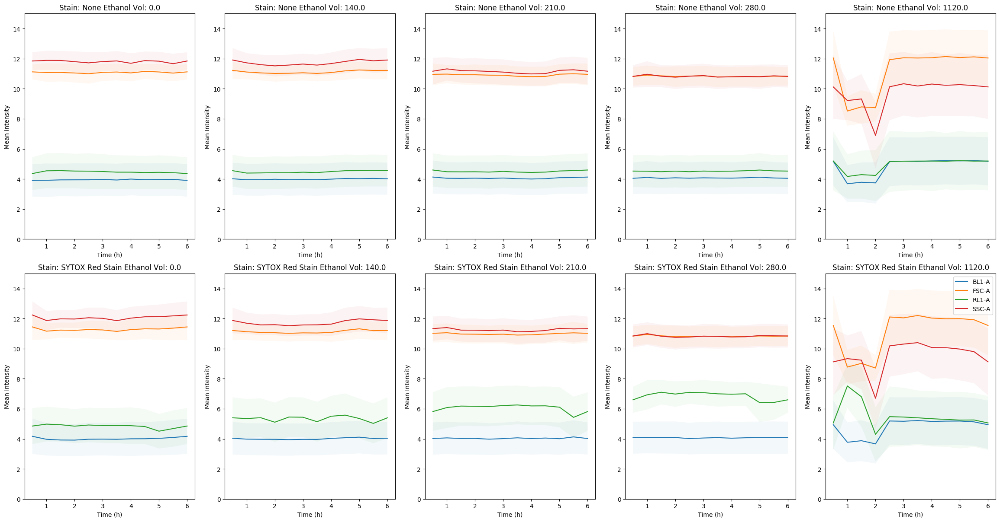

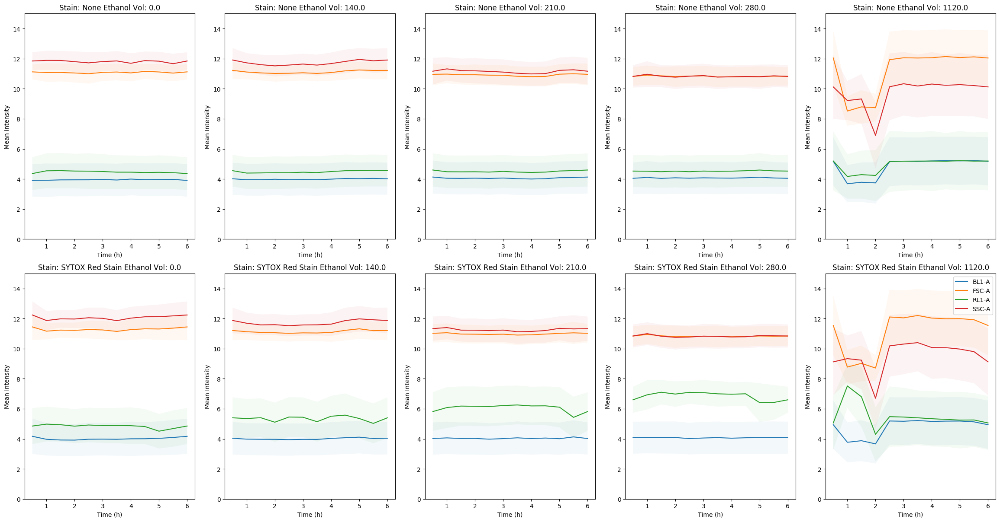

In [11]:
mean_channel_df1 = mean_channel_df.merge(flow_data, how='left', on='time_point')

channels=['FSC-A', 'SSC-A', 'RL1-A', 'BL1-A']
#channels=['FSC-A', 'SSC-A', 'BL1-A', 'RL1-A', 'FSC-H', 
#                                      'SSC-H', 'BL1-H', 'RL1-H', 'FSC-W', 'SSC-W',
#                                      'BL1-W', 'RL1-W']

bldp.get_channel_mean_timeseries(mean_channel_df1, 
                               channels=channels
                               )

In [4]:
leader_board_df = blda.get_leader_board_df('.', expand_description=True)
#leader_board_df.loc[leader_board_df['stain'].isna()]
bldp.get_statistics_by_volume(leader_board_df, experiment_strain=run_strain, experiment_lab=experiment_lab)

NameError: name 'bldp' is not defined

(<Figure size 1600x800 with 2 Axes>, mean    0.011648
 std     0.018305
 dtype: float64)

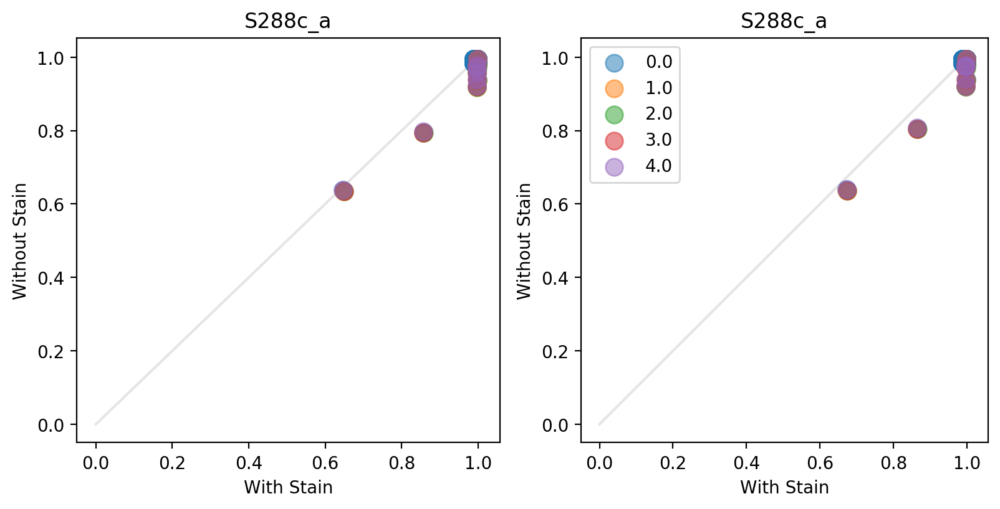

In [182]:
leader_board_df = blda.get_leader_board_df('.', expand_description=True)
bldp.get_stain_scatter(leader_board_df, experiments[2], experiment_strain=run_strain)

Index(['Container Type', 'Control', 'Culture_Volume', 'Media', 'Replicate', 'Storage (C)', 'Strain', 'checksum', 'filename', 'kill', 'kill_volume', 'plate_id', 'source', 'stain', 'well', 'experiment_id', 'Time', 'FSC-A', 'SSC-A', 'BL1-A', 'RL1-A', 'FSC-H', 'SSC-H', 'BL1-H', 'RL1-H', 'FSC-W', 'SSC-W', 'BL1-W', 'RL1-W', 'index', 'live', 'live_ss'], dtype='object')


Text(0.5, 0, 'Ethanol %')

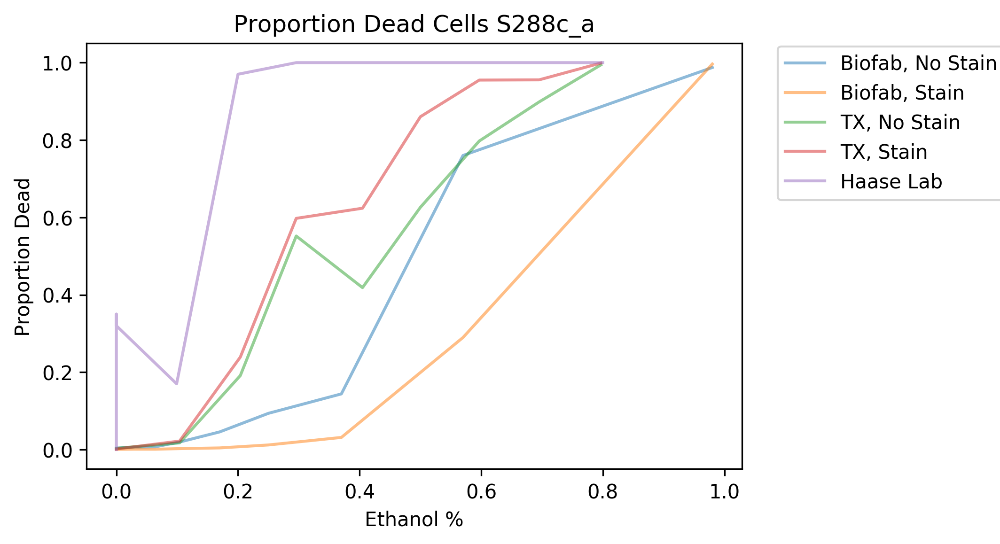

In [199]:
# For each sample, what proportion are dead?

robs_experiment = pd.read_csv('../resources/6-12_percent_dead.csv')

data_dir = os.path.join('data/biofab', experiments[1])
all_data_file = os.path.join(data_dir, 'data.csv')
experiment_df = pd.read_csv(all_data_file, index_col=0)


data_dir1 = os.path.join('data/transcriptic')
all_data_file1 = os.path.join(data_dir1, 'data.csv')
experiment_df1 = pd.read_csv(all_data_file1, index_col=0)
print(experiment_df1.columns)

#dead_proportion = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume', 'sample_id', 'stain'])['live'].agg(lambda x: 1 - x.mean()).groupby(['kill_volume', 'stain']).agg(np.mean).reset_index().rename(columns={'live' : 'dead'})
dead_proportion = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume',  'stain'])['live'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live' : 'dead'})
dead_proportion = dead_proportion.loc[dead_proportion.kill_volume != "None"]
#dead_proportion_ss = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume', 'sample_id', 'stain'])['live_ss'].agg(lambda x: 1 - x.mean()).groupby(['kill_volume', 'stain']).agg(np.mean).reset_index().rename(columns={'live_ss' : 'dead_ss'})
dead_proportion_ss = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume', 'stain'])['live_ss'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live_ss' : 'dead_ss'})
dead_proportion_ss = dead_proportion_ss.loc[dead_proportion_ss.kill_volume != "None"]


#dead_proportion1 = experiment_df1.where((pd.notnull(experiment_df1)), "None").groupby(['kill_volume', 'well', 'stain'])['live'].agg(lambda x: 1 - x.mean()).groupby(['kill_volume', 'stain']).agg(np.mean).reset_index().rename(columns={'live' : 'dead'})
dead_proportion1 = experiment_df1.where((pd.notnull(experiment_df1)), "None").groupby(['kill_volume', 'stain'])['live'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live' : 'dead'})
dead_proportion1 = dead_proportion1.loc[dead_proportion1.kill_volume != "None"]
dead_proportion1_ss = experiment_df1.where((pd.notnull(experiment_df1)), "None").groupby(['kill_volume', 'stain'])['live_ss'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live_ss' : 'dead_ss'})
dead_proportion1_ss = dead_proportion1_ss.loc[dead_proportion1_ss.kill_volume != "None"]



#experiment_id = experiment_df.experiment_id.dropna().unique()[0]
experiment_id = experiment_df.strain.dropna().unique()[0]
#print(dead_proportion)
fig = plt.figure(dpi=300)
ax = plt.subplot(111)
percentages=[ 100*x for x in [0, .03, .06, .10, .15, .20, .27, .36, .49]]

df=dead_proportion.loc[dead_proportion.stain == "None"]
ax.plot(df['kill_volume']/1000, df['dead'], label="Biofab, No Stain", alpha=0.5)
df=dead_proportion.loc[dead_proportion.stain == "SYTOX Red Stain"]
ax.plot(df['kill_volume']/1000, df['dead'], label="Biofab, Stain", alpha=0.5)
#df=dead_proportion_ss.loc[dead_proportion_ss.stain == "None"]
#ax.plot(df['kill_volume']/1000, df['dead_ss'], label="Biofab, No Stain, SS", alpha=0.5)
#df=dead_proportion_ss.loc[dead_proportion_ss.stain == "SYTOX Red Stain"]
#ax.plot(df['kill_volume']/1000, df['dead_ss'], label="Biofab, Stain, SS", alpha=0.5)


df=dead_proportion1.loc[dead_proportion1.stain == "None"]
ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead'], label="TX, No Stain", alpha=0.5)
df=dead_proportion1.loc[dead_proportion1.stain == "SYTOX Red Stain"]
ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead'], label="TX, Stain", alpha=0.5)
#df=dead_proportion1_ss.loc[dead_proportion1_ss.stain == "None"]
#ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead_ss'], label="TX, No Stain, SS", alpha=0.5)
#df=dead_proportion1_ss.loc[dead_proportion1_ss.stain == "SYTOX Red Stain"]
#ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead_ss'], label="TX, Stain, SS", alpha=0.5)


ax.plot(robs_experiment["Ethanol vol (ul)"]/(robs_experiment["Ethanol vol (ul)"]+robs_experiment["culture vol (ul)"]), 
        robs_experiment['% Dead'], label="Haase Lab", alpha=0.5)
#ax.bar()
#ax.set_xscale('log')
fig.legend(bbox_to_anchor=(1.2, 0.9))
plt.title("Proportion Dead Cells "  + experiment_id)
ax.set_ylabel("Proportion Dead")
ax.set_xlabel("Ethanol %")
#plt.xticks(range(0, len(volumes)), volumes)


Index(['Container Type', 'Control', 'Culture_Volume', 'Media', 'Replicate', 'Storage (C)', 'Strain', 'checksum', 'filename', 'kill', 'kill_volume', 'plate_id', 'source', 'stain', 'well', 'experiment_id', 'Time', 'FSC-A', 'SSC-A', 'BL1-A', 'RL1-A', 'FSC-H', 'SSC-H', 'BL1-H', 'RL1-H', 'FSC-W', 'SSC-W', 'BL1-W', 'RL1-W', 'index', 'live', 'live_ss'], dtype='object')


Text(0.5, 0, 'Ethanol %')

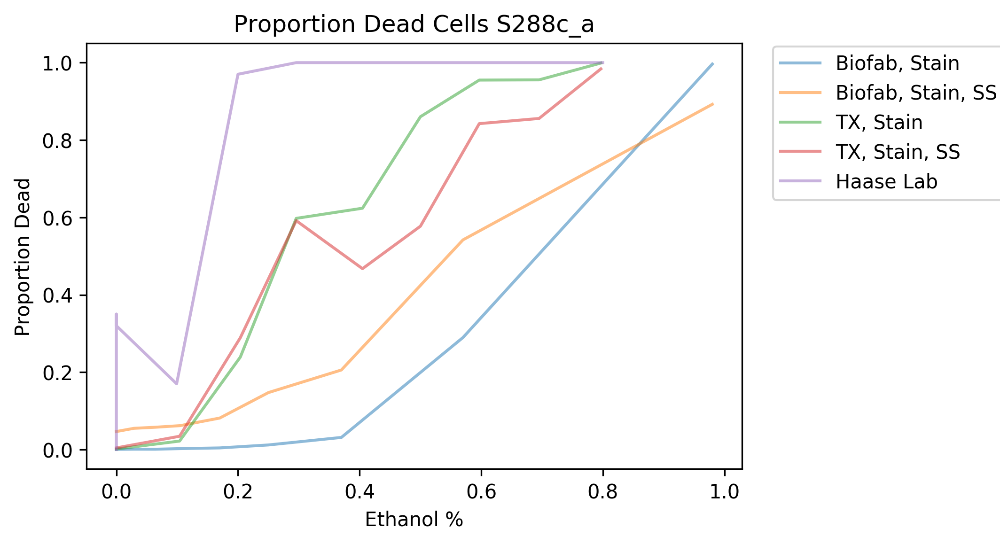

In [200]:
# For each sample, what proportion are dead?

robs_experiment = pd.read_csv('../resources/6-12_percent_dead.csv')

data_dir = os.path.join('data/biofab', experiments[1])
all_data_file = os.path.join(data_dir, 'data.csv')
experiment_df = pd.read_csv(all_data_file, index_col=0)


data_dir1 = os.path.join('data/transcriptic')
all_data_file1 = os.path.join(data_dir1, 'data.csv')
experiment_df1 = pd.read_csv(all_data_file1, index_col=0)
print(experiment_df1.columns)

#dead_proportion = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume', 'sample_id', 'stain'])['live'].agg(lambda x: 1 - x.mean()).groupby(['kill_volume', 'stain']).agg(np.mean).reset_index().rename(columns={'live' : 'dead'})
dead_proportion = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume',  'stain'])['live'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live' : 'dead'})
dead_proportion = dead_proportion.loc[dead_proportion.kill_volume != "None"]
#dead_proportion_ss = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume', 'sample_id', 'stain'])['live_ss'].agg(lambda x: 1 - x.mean()).groupby(['kill_volume', 'stain']).agg(np.mean).reset_index().rename(columns={'live_ss' : 'dead_ss'})
dead_proportion_ss = experiment_df.where((pd.notnull(experiment_df)), "None").groupby(['kill_volume', 'stain'])['live_ss'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live_ss' : 'dead_ss'})
dead_proportion_ss = dead_proportion_ss.loc[dead_proportion_ss.kill_volume != "None"]


#dead_proportion1 = experiment_df1.where((pd.notnull(experiment_df1)), "None").groupby(['kill_volume', 'well', 'stain'])['live'].agg(lambda x: 1 - x.mean()).groupby(['kill_volume', 'stain']).agg(np.mean).reset_index().rename(columns={'live' : 'dead'})
dead_proportion1 = experiment_df1.where((pd.notnull(experiment_df1)), "None").groupby(['kill_volume', 'stain'])['live'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live' : 'dead'})
dead_proportion1 = dead_proportion1.loc[dead_proportion1.kill_volume != "None"]
dead_proportion1_ss = experiment_df1.where((pd.notnull(experiment_df1)), "None").groupby(['kill_volume', 'stain'])['live_ss'].agg(lambda x: 1 - x.mean()).reset_index().rename(columns={'live_ss' : 'dead_ss'})
dead_proportion1_ss = dead_proportion1_ss.loc[dead_proportion1_ss.kill_volume != "None"]



#experiment_id = experiment_df.experiment_id.dropna().unique()[0]
experiment_id = experiment_df.strain.dropna().unique()[0]
#print(dead_proportion)
fig = plt.figure(dpi=300)
ax = plt.subplot(111)
percentages=[ 100*x for x in [0, .03, .06, .10, .15, .20, .27, .36, .49]]

#df=dead_proportion.loc[dead_proportion.stain == "None"]
#ax.plot(df['kill_volume']/1000, df['dead'], label="Biofab, No Stain", alpha=0.5)
df=dead_proportion.loc[dead_proportion.stain == "SYTOX Red Stain"]
ax.plot(df['kill_volume']/1000, df['dead'], label="Biofab, Stain", alpha=0.5)
#df=dead_proportion_ss.loc[dead_proportion_ss.stain == "None"]
#ax.plot(df['kill_volume']/1000, df['dead_ss'], label="Biofab, No Stain, SS", alpha=0.5)
df=dead_proportion_ss.loc[dead_proportion_ss.stain == "SYTOX Red Stain"]
ax.plot(df['kill_volume']/1000, df['dead_ss'], label="Biofab, Stain, SS", alpha=0.5)


#df=dead_proportion1.loc[dead_proportion1.stain == "None"]
#ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead'], label="TX, No Stain", alpha=0.5)
df=dead_proportion1.loc[dead_proportion1.stain == "SYTOX Red Stain"]
ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead'], label="TX, Stain", alpha=0.5)
#df=dead_proportion1_ss.loc[dead_proportion1_ss.stain == "None"]
#ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead_ss'], label="TX, No Stain, SS", alpha=0.5)
df=dead_proportion1_ss.loc[dead_proportion1_ss.stain == "SYTOX Red Stain"]
ax.plot(df['kill_volume']/(df['kill_volume']+250), df['dead_ss'], label="TX, Stain, SS", alpha=0.5)


ax.plot(robs_experiment["Ethanol vol (ul)"]/(robs_experiment["Ethanol vol (ul)"]+robs_experiment["culture vol (ul)"]), 
        robs_experiment['% Dead'], label="Haase Lab", alpha=0.5)
#ax.bar()
#ax.set_xscale('log')
fig.legend(bbox_to_anchor=(1.2, 0.9))
plt.title("Proportion Dead Cells "  + experiment_id)
ax.set_ylabel("Proportion Dead")
ax.set_xlabel("Ethanol %")
#plt.xticks(range(0, len(volumes)), volumes)


In [162]:
dead_proportion['kill_volume'].unique()

array([0.0, 29.0, 64.0, 105.0, 170.0, 250.0, 370.0, 570.0, 980.0],
      dtype=object)

In [155]:
dead_proportion1['kill_volume']/(dead_proportion1['kill_volume']+1000)

0     0        
1     0        
2     0.0281827
3     0.0281827
4     0.0601504
5     0.0601504
6     0.0950226
7     0.0950226
8     0.145299 
9     0.145299 
10    0.2      
11    0.2      
12    0.270073 
13    0.270073 
14    0.363057 
15    0.363057 
16    0.494949 
17    0.494949 
Name: kill_volume, dtype: object

In [112]:
robs_experiment

,Treatment,% Dead,culture vol (ul),Ethanol vol (ul),% Ethanol
0,Control 1,0.00,1000,0,0.0
1,Control 2,0.35,1000,0,0.0
2,Control 3,0.32,1000,0,0.0
3,10% Ethanol,0.17,1000,110,0.1
4,20% Ethanol,0.97,1000,250,0.2
5,30% Ethanol,1.00,1000,420,0.3
6,40% Ethanol,1.00,1000,680,0.4
7,50% Ethanol,1.00,1000,1000,0.5
8,60% Ethanol,1.00,1000,1500,0.6
9,70% Ethanol,1.00,1000,2300,0.7


In [123]:
df = experiment_df.loc[experiment_df['stain'].isna()].groupby(['kill_volume']).agg(np.mean).reset_index()

#df = df.loc[df['live'] == 1]
df

,kill_volume,level,stain_volume,temperature,FSC-A,SSC-A,FL1-A,FL2-A,FL3-A,FL4-A,FSC-H,SSC-H,FL1-H,FL2-H,FL3-H,FL4-H,Width,Time,index,live
0,0.0,0.0,NaN,30.0,1.286958e+06,1.346926e+05,1034.457842,409.249025,817.285917,484.002983,1.514119e+06,1.588075e+05,1102.681267,417.542842,1269.059825,1046.516600,55.733767,166.176275,1.681295e+06,0.996225
1,29.0,0.0,NaN,30.0,1.283254e+06,1.350910e+05,1100.840575,429.722700,830.089258,482.576242,1.511980e+06,1.602445e+05,1131.949533,425.528267,1267.778275,1037.558133,55.420317,172.123733,1.651295e+06,0.993825
2,64.0,0.0,NaN,30.0,1.327215e+06,1.396662e+05,1155.489992,450.612192,845.800992,477.385867,1.573616e+06,1.672782e+05,1156.600600,431.930358,1261.812567,1020.837942,55.454492,180.282150,1.621295e+06,0.992908
3,105.0,0.0,NaN,30.0,1.210569e+06,1.187208e+05,1357.343375,536.261992,909.310733,446.509117,1.520150e+06,1.479912e+05,1196.947225,450.858317,1205.484242,915.252608,52.569433,200.472917,1.591295e+06,0.980442
4,170.0,0.0,NaN,30.0,1.129597e+06,1.105586e+05,1688.059867,660.114983,1058.230917,435.610025,1.454739e+06,1.428065e+05,1347.158267,505.103033,1233.973692,856.343450,50.849417,213.475350,1.561295e+06,0.954908
5,250.0,0.0,NaN,30.0,1.102304e+06,1.224289e+05,1778.637417,746.022500,1270.381408,428.945992,1.453162e+06,1.640119e+05,1374.540433,545.722125,1312.070092,816.487292,49.521858,224.883983,1.531295e+06,0.906800
6,370.0,0.0,NaN,30.0,1.204099e+06,1.498971e+05,2058.188600,832.691267,1410.405200,423.631517,1.533997e+06,1.970778e+05,1446.702367,565.731750,1317.636283,757.163508,51.483933,288.179533,1.501295e+06,0.856575
7,570.0,0.0,NaN,30.0,5.601816e+05,5.962937e+04,1528.297278,663.694736,1087.972940,377.015997,8.745471e+05,8.928961e+04,1339.074282,526.822553,1094.555739,598.788861,35.643375,1164.383878,1.472637e+06,0.240156
8,980.0,0.0,NaN,30.0,8.247590e+06,8.702108e+06,6137.294449,1982.232979,5057.568651,576.887095,3.113633e+06,3.605369e+06,4312.516738,1338.120727,2729.913705,606.483362,88.798888,1892.149048,1.653739e+06,0.012299


1    1750162
0    348498 
Name: live, dtype: int64
['SYTOX Red Stain' nan]
                                             agave_path         agave_system challenge_problem               experiment_id                experiment_reference                                                         experiment_reference_url file_type                                                                                     filename                                                                                     hpc_path                                                                      jupyter_path kill_method  kill_volume kill_volume_unit        lab  level measurement_type                                           sample_id            stain  stain_volume stain_volume_unit   strain         strain_lab_id                                   strain_sbh_uri  temperature      FSC-A      SSC-A     FL1-A    FL2-A    FL3-A    FL4-A      FSC-H      SSC-H    FL1-H    FL2-H    FL3-H   FL4-H  Width   Time  index

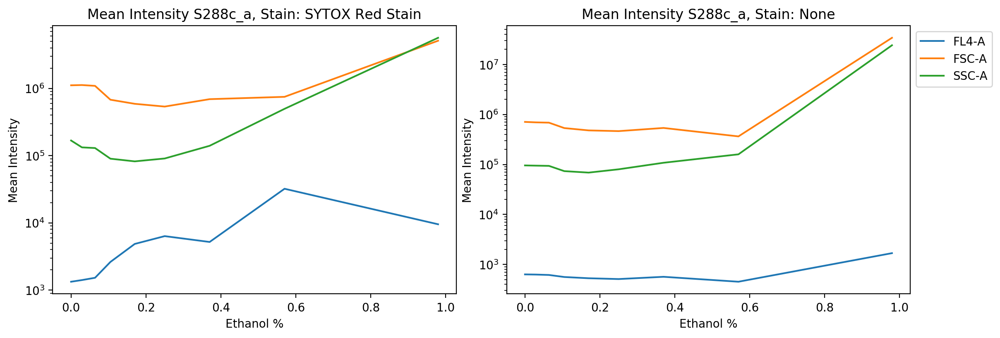

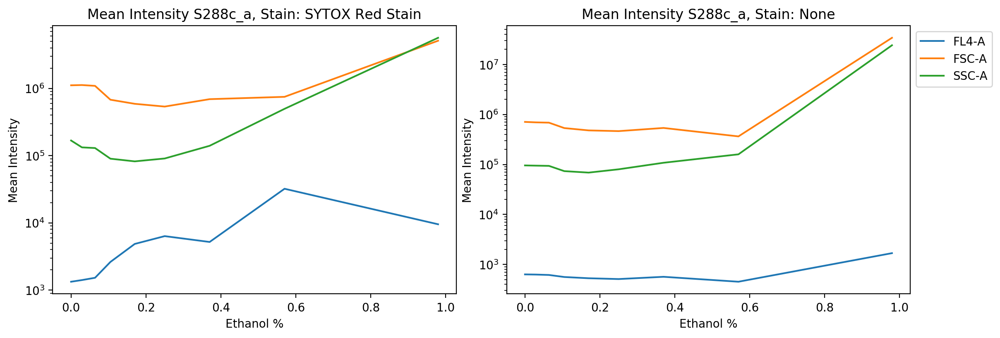

In [193]:
data_dir = os.path.join('data/biofab', experiments[1])
all_data_file = os.path.join(data_dir, 'data.csv')
experiment_df = pd.read_csv(all_data_file, index_col=0)
print(experiment_df.live.value_counts())
channels=['FSC-A', 'SSC-A', 'FL4-A']
bldp.get_channel_mean_titration(experiment_df, only_live=False, channels=channels,stat=np.std)

['SYTOX Red Stain' nan]
  Container Type Control                  Culture_Volume                                                                                                                                                              Media Replicate Storage (C)                                                                                                                                                           Strain                                  checksum                                                                                    filename     kill  kill_volume  plate_id            source            stain well   experiment_id  Time      FSC-A      SSC-A   BL1-A    RL1-A    FSC-H     SSC-H  BL1-H    RL1-H   FSC-W   SSC-W  BL1-W  RL1-W  index  live  live_ss
0  96-pcr         {}      {'qty': 1000.0, 'units': 'uL'}  {'YPAD': {'item_id': 378596, 'item_concentration': None, 'final_concentration': None, 'dilution_factor': None, 'working_volume': {'qty': 1000.0, 'units': 'µl'}}}

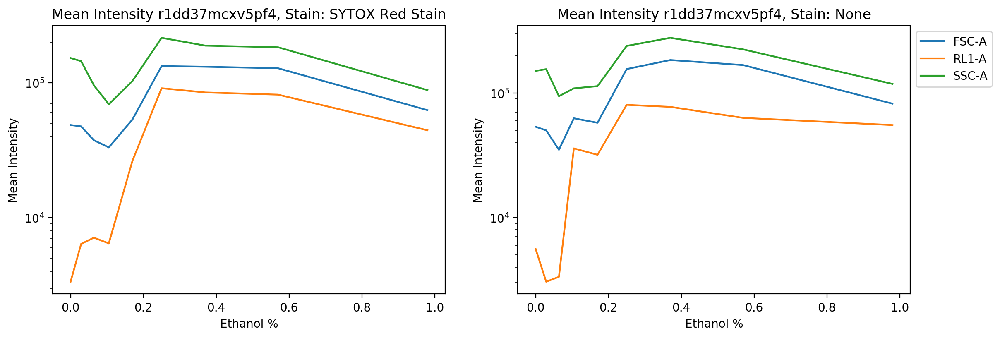

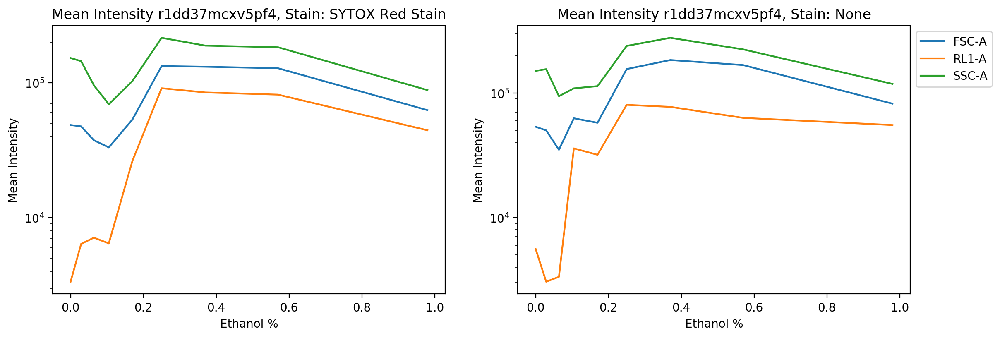

In [194]:
data_dir = os.path.join('data/transcriptic')
all_data_file = os.path.join(data_dir, 'data.csv')
experiment_df = pd.read_csv(all_data_file, index_col=0)


channels=['FSC-A', 'SSC-A', 'BL1-A', 'RL1-A', 'FSC-H', 
                                      'SSC-H', 'BL1-H', 'RL1-H', 'FSC-W', 'SSC-W',
                                      'BL1-W', 'RL1-W']
channels=['FSC-A', 'SSC-A', 'RL1-A']
bldp.get_channel_mean_titration(experiment_df, 
                               channels=channels,
                                stat=np.std
                               )

In [128]:
data_dir = os.path.join('data/biofab', experiments[1])
all_data_file = os.path.join(data_dir, 'data.csv')
experiment_df = pd.read_csv(all_data_file, index_col=0)

bldp.get_channel_histograms(experiment_df)

[autoreload of pysd2cat.plot.biofab_live_dead_plots failed: Traceback (most recent call last):
  File "/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotocol-reactor/xplan-dev-env/xplan-dev-env/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotocol-reactor/xplan-dev-env/xplan-dev-env/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 434, in superreload
    module = reload(module)
  File "/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotocol-reactor/xplan-dev-env/xplan-dev-env/lib/python3.7/imp.py", line 315, in reload
    return importlib.reload(module)
  File "/Users/danbryce/Documents/sift/xplan/external/xplan/xplan-to-autoprotocol-reactor/xplan-dev-env/xplan-dev-env/lib/python3.7/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen im

In [111]:
data_dir = os.path.join('data/transcriptic')
all_data_file = os.path.join(data_dir, 'data.csv')
experiment_df = pd.read_csv(all_data_file, index_col=0)

#bldp.get_channel_mean_titration(experiment_df)
bldp.get_channel_histograms(experiment_df, 
                               channels=['FSC-A', 'SSC-A', 'BL1-A', 'RL1-A', 'FSC-H', 
                                      'SSC-H', 'BL1-H', 'RL1-H', 'FSC-W', 'SSC-W',
                                      'BL1-W', 'RL1-W'])

In [159]:
all=experiment_df.loc[experiment_df['kill_volume'] == 250.0]['FL1-A'].sum()
live=experiment_df.loc[(experiment_df['kill_volume'] == 250.0) & (experiment_df['live'] == 1)]['FL1-A'].sum()
ratio = live/all
print(all)
print(live)
print(ratio)
print(experiment_df.loc[(experiment_df['kill_volume'] == 250.0)]['live'].mean())

407045863.0
376115824.0
0.9240133807722792
0.953375
